## Focus on Suprabasal cells

In [1]:
# Import useful modules

import numpy as np
import pandas as pd
import scanpy as sc
import os
#import igraph
import matplotlib.pyplot as plt
import seaborn

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=90)

scanpy==1.4+39.gc70f24b anndata==0.6.18 numpy==1.16.2 scipy==1.2.1 pandas==0.24.1 scikit-learn==0.20.3 statsmodels==0.9.0 python-igraph==0.7.1 


In [3]:
# Load the integrated and annotated dataset
adata_ann = sc.read_h5ad('/Data/Annotated_dataset_v1.h5ad')

# Load non-integrated & pre-processed dataset
adata_raw = sc.read_h5ad('/Data/PreProcessed_preliminary_dataset.h5ad')

In [4]:
# Transfer annotation onto a non-data integrated anndata object.
adata = adata_raw[adata_ann.obs.index.tolist(), ]
adata.obs['cell_type'] = adata_ann.obs['cell_type']

In [8]:
sup_cell_bool = []

for x in adata.obs['cell_type_small']:
    sup_cell_bool = sup_cell_bool + [x in ['Suprabasal', 'Suprabasal N']]


In [9]:
list_of_cell_names = adata.obs.loc[sup_cell_bool, :].index.tolist()
adata = adata[list_of_cell_names, ]
adata.shape

(13167, 18417)

In [10]:
adata = sc.AnnData(adata)

In [11]:
sc.tl.pca(adata, svd_solver='arpack')

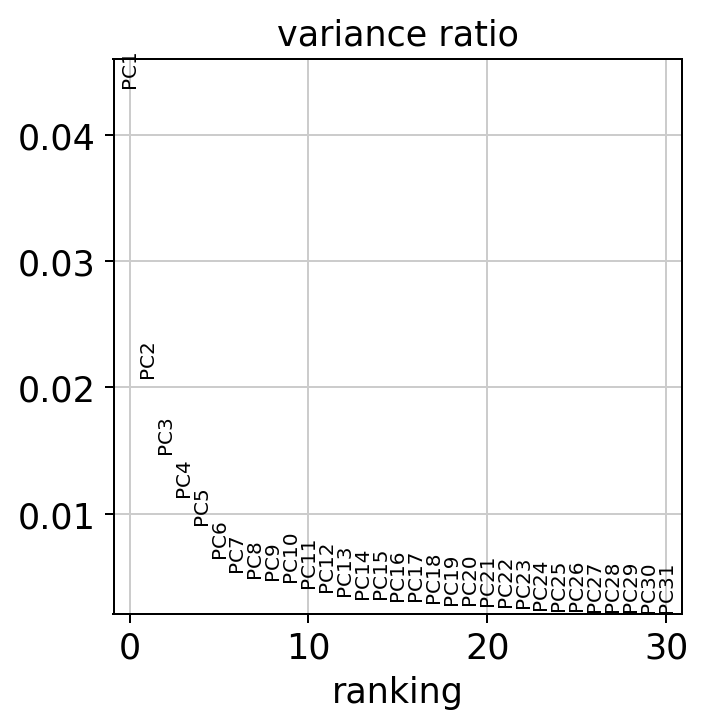

In [12]:
sc.pl.pca_variance_ratio(adata, log = False)

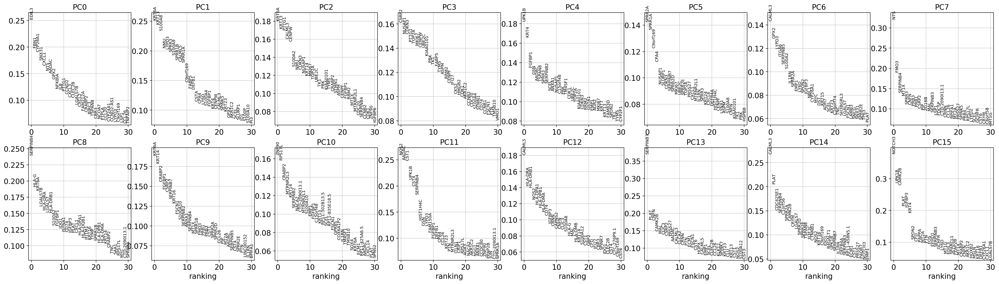

In [13]:
sc.pl.pca_loadings(adata, components=list(range(0,16)))

### Embedding

In [14]:
sc.pp.neighbors(adata, n_neighbors=100, n_pcs=5)

computing neighbors
    using 'X_pca' with n_pcs = 5
    finished (0:00:21.91) --> added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix


In [15]:
sc.tl.umap(adata)

computing UMAP
    finished (0:00:36.22) --> added
    'X_umap', UMAP coordinates (adata.obsm)


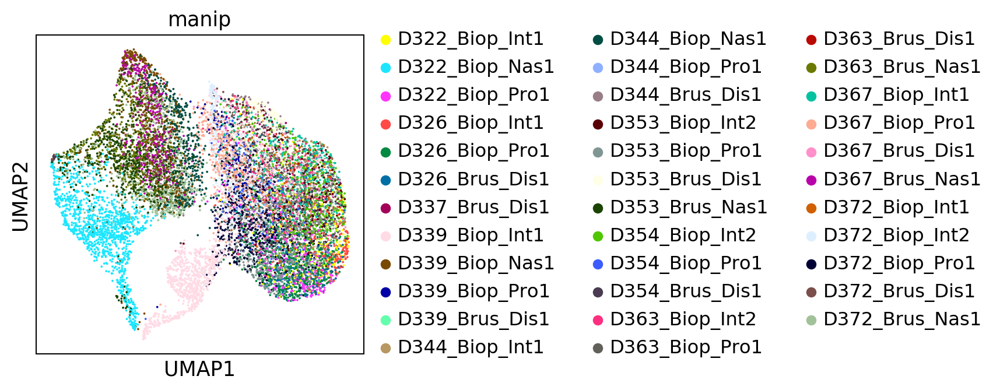

In [16]:
sc.pl.umap(adata, color=['manip'], edges = False)

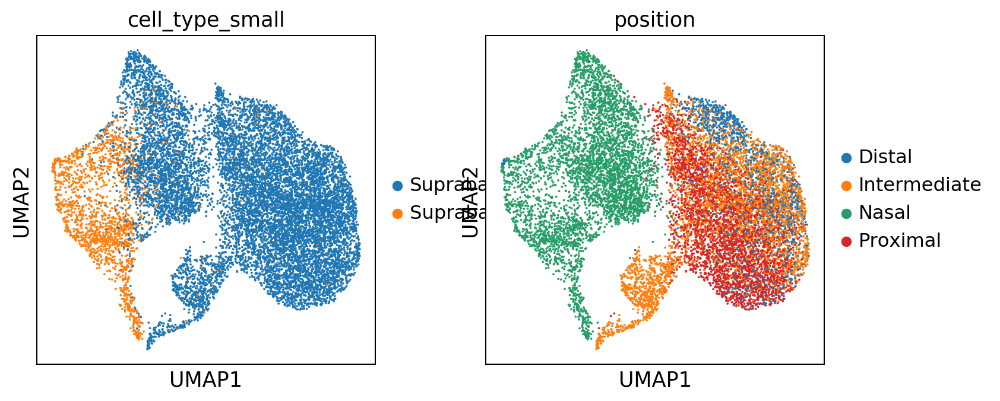

In [17]:
sc.pl.umap(adata, color=['cell_type_small', 'position'], edges = False)

In [18]:
communities, graph, Q = sc.external.tl.phenograph(adata.obsm['X_pca'][:,0:5], k=100)

PhenoGraph clustering
Finding 100 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.9549448490142822 seconds
Jaccard graph constructed in 17.747139930725098 seconds
Wrote graph to binary file in 6.693228483200073 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.788711
After 2 runs, maximum modularity is Q = 0.789996
After 4 runs, maximum modularity is Q = 0.791898
After 12 runs, maximum modularity is Q = 0.793147
Louvain completed 32 runs in 48.30627131462097 seconds
PhenoGraph complete in 73.99316310882568 seconds
    finished (0:01:14.37)


In [27]:
#adata.obs['phenograph_3'] = pd.Categorical(communities)
adata.obs.insert(5, 'phenograph_3', pd.Categorical(communities))

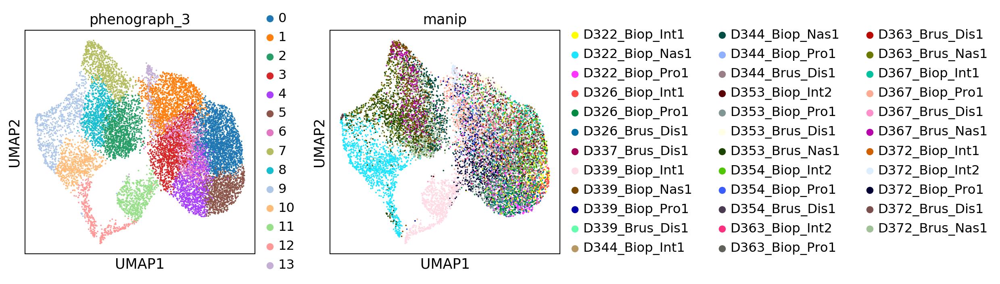

In [29]:
sc.pl.umap(adata, color=['phenograph_3', 'manip'])

In [48]:
new_cluster_names = {
    '0':'Suprabasal', '1':'Suprabasal', '2':'Suprabasal N', '3':'Suprabasal', '4':'Suprabasal', # 0-4
    '5':'Suprabasal','6':'Suprabasal', '7':'Suprabasal N', '8':'Suprabasal N', '9':'Suprabasal mix',
    '10':'Suprabasal mix', '11':'Suprabasal mix', '12':'Suprabasal mix', '13':'Suprabasal'
                    }

... storing 'cell_type_suprabasal' as categorical


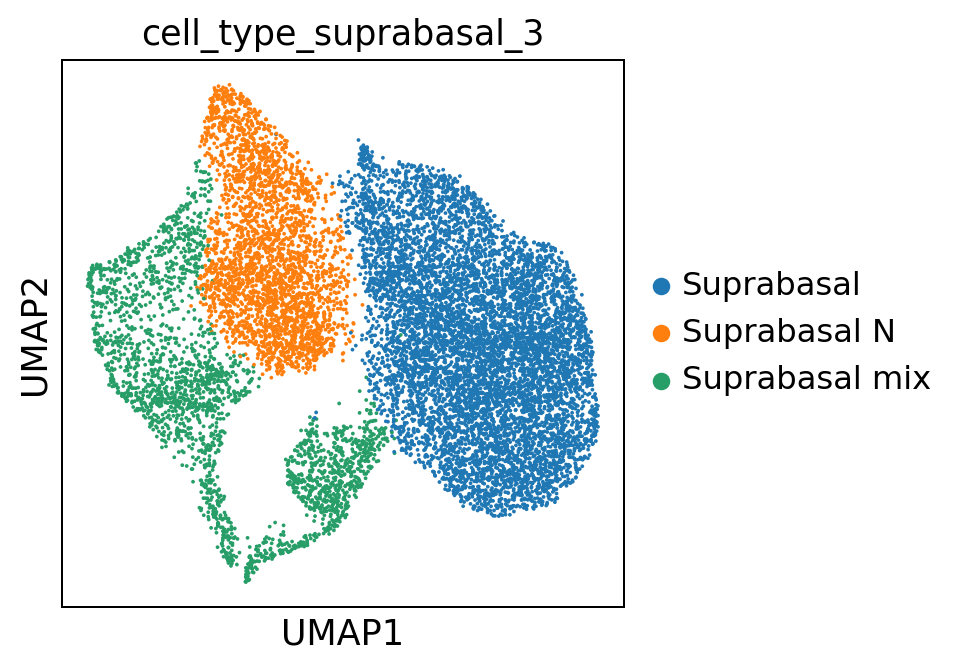

In [50]:
sc.pl.umap(adata, color=['cell_type_suprabasal_3'])

**Suprabasal mix cells corresponding to KRT13+ cells**

In [51]:
sc.tl.rank_genes_groups(adata, groupby = 'cell_type_suprabasal_3', method='wilcoxon')

ranking genes


... storing 'cell_type_suprabasal' as categorical


    finished (0:00:33.46) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids


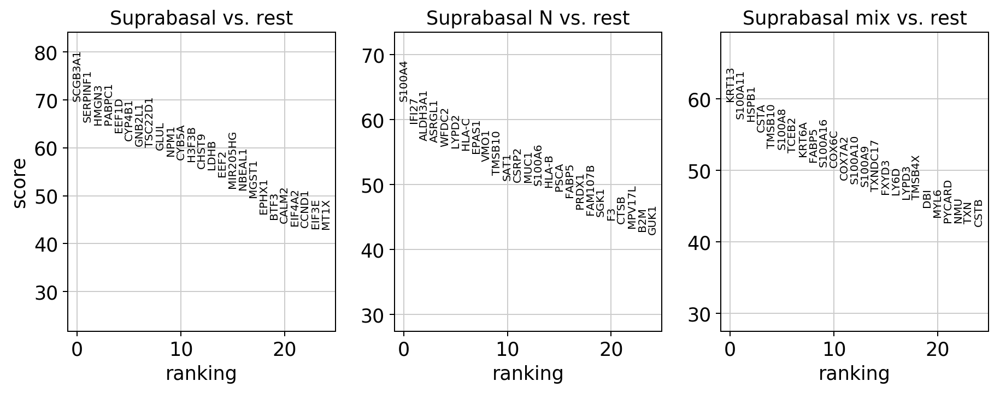

In [52]:
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

... storing 'cell_type_suprabasal' as categorical


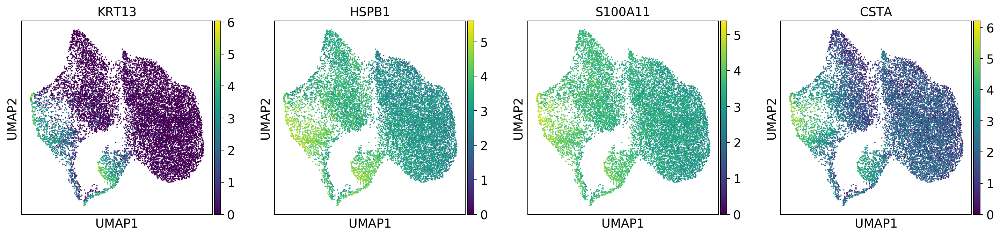

In [53]:
sc.pl.umap(adata, color=['KRT13', 'HSPB1', 'S100A11', 'CSTA'])

... storing 'cell_type_suprabasal' as categorical


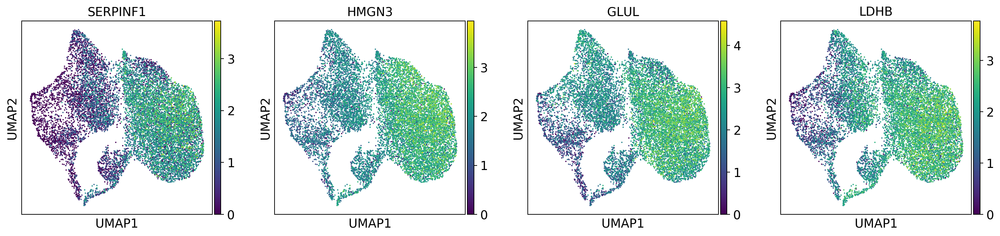

In [54]:
sc.pl.umap(adata, color=['SERPINF1', 'HMGN3', 'GLUL', 'LDHB'])

In [58]:
sc.tl.rank_genes_groups(adata, groupby = 'cell_type_suprabasal_3', method='wilcoxon',
                       groups= ['Suprabasal'], reference = 'Suprabasal N')

ranking genes


... storing 'cell_type_suprabasal' as categorical


    finished (0:00:28.62) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids


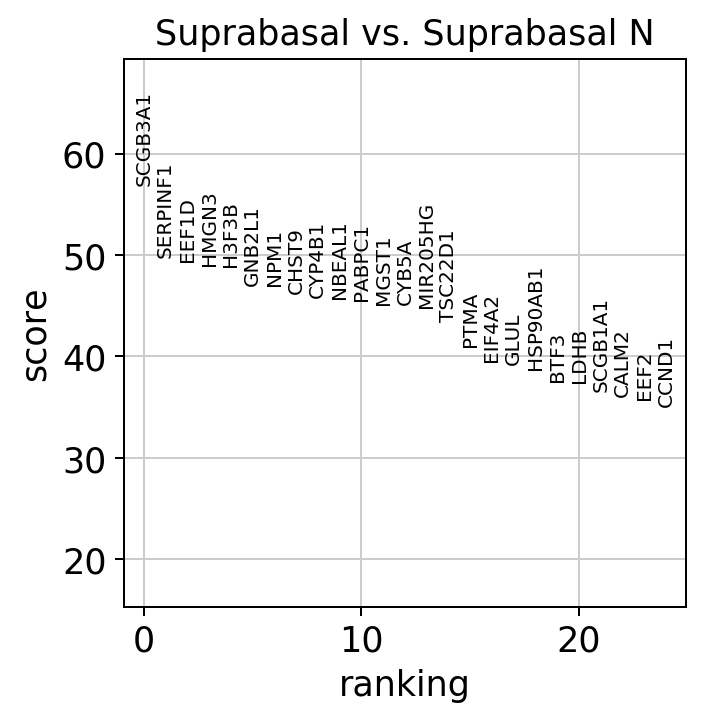

In [59]:
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

... storing 'cell_type_suprabasal' as categorical


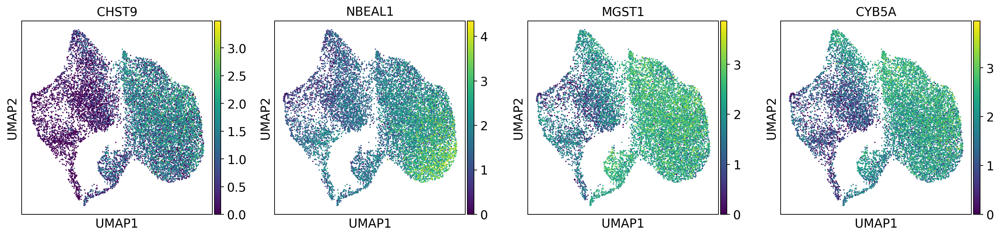

In [61]:
sc.pl.umap(adata, color=['CHST9', 'NBEAL1', 'MGST1', 'CYB5A'])

In [62]:
sc.tl.rank_genes_groups(adata, groupby = 'cell_type_suprabasal_3', method='wilcoxon',
                       groups= ['Suprabasal N'], reference = 'Suprabasal')

ranking genes


... storing 'cell_type_suprabasal' as categorical


    finished (0:00:28.08) --> added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids


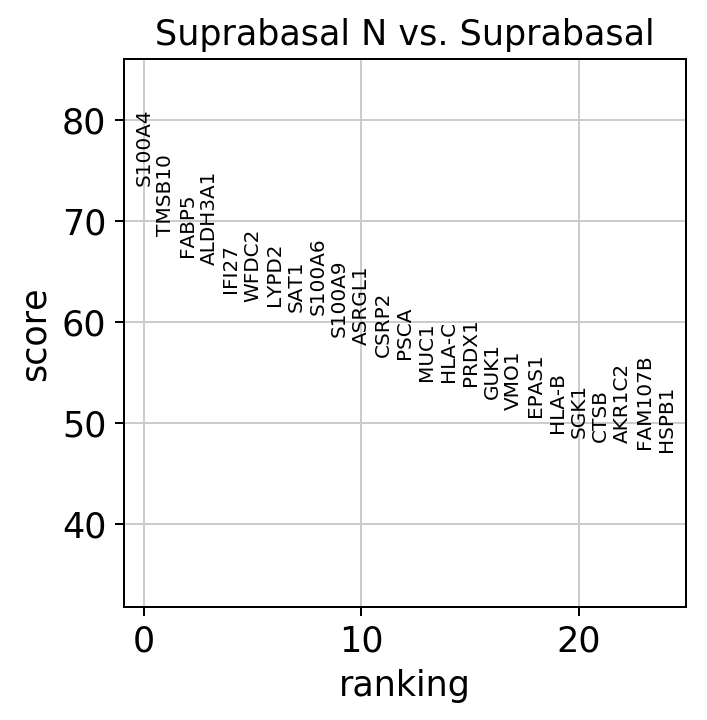

In [63]:
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

... storing 'cell_type_suprabasal' as categorical


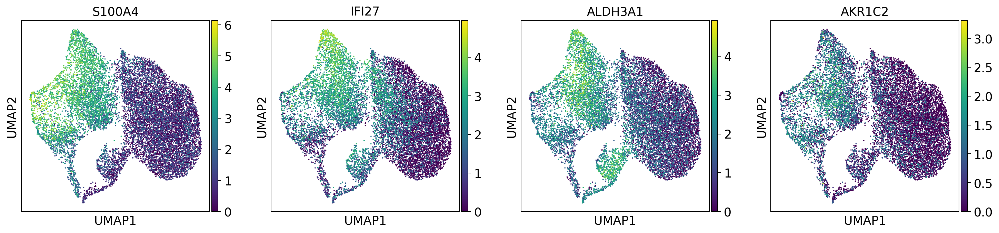

In [67]:
sc.pl.umap(adata, color=['S100A4', 'IFI27', 'ALDH3A1', 'AKR1C2'])

In [68]:
adata.obs.to_csv(path_or_buf = '/data/deprez_data/HCA/Analysis/FullDataset_v6/Suprabasal_metadata.tsv', 
               sep = '\t', index = False)

In [75]:
adata.write('/data/deprez_data/HCA/Analysis/FullDataset_v6/anndata_V6_Suprabasal.h5ad')

***
***

## Focus on Suprabasal and Secretory cells 

In [6]:
cell_bool = []

for x in adata.obs['cell_type']:
    cell_bool = cell_bool + [x in ['Suprabasal', 'Suprabasal N', 'Secretory', 'Secretory N']]


In [7]:
list_of_cell_names = adata.obs.loc[cell_bool, :].index.tolist()
adata = adata[list_of_cell_names, ]
adata.shape

(33708, 18417)

In [9]:
adata = sc.AnnData(adata)

In [10]:
sc.tl.pca(adata, svd_solver='arpack')

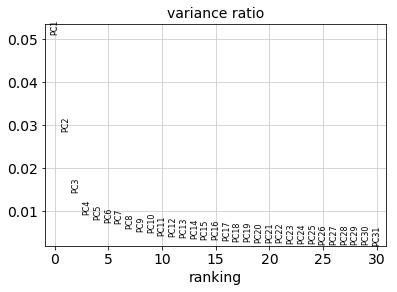

In [11]:
sc.pl.pca_variance_ratio(adata, log = False)

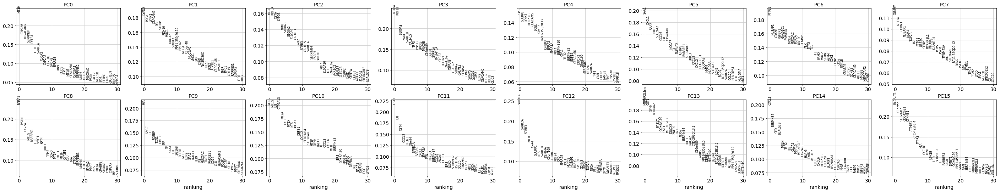

In [12]:
sc.pl.pca_loadings(adata, components=list(range(0,16)))

In [13]:
sc.pp.neighbors(adata, n_neighbors=100, n_pcs=5)

computing neighbors
    using 'X_pca' with n_pcs = 5
    finished (0:00:40.76) --> added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix


In [14]:
sc.tl.umap(adata)

computing UMAP
    finished (0:01:02.32) --> added
    'X_umap', UMAP coordinates (adata.obsm)


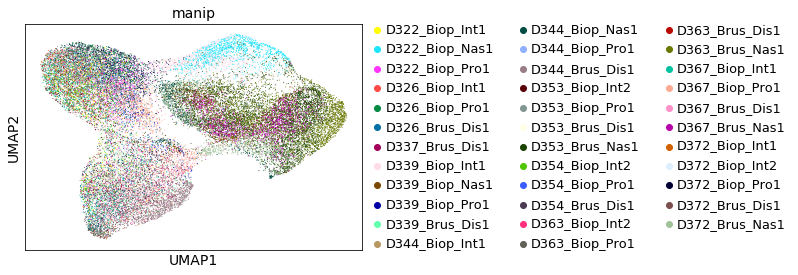

In [15]:
sc.pl.umap(adata, color=['manip'], edges = False)

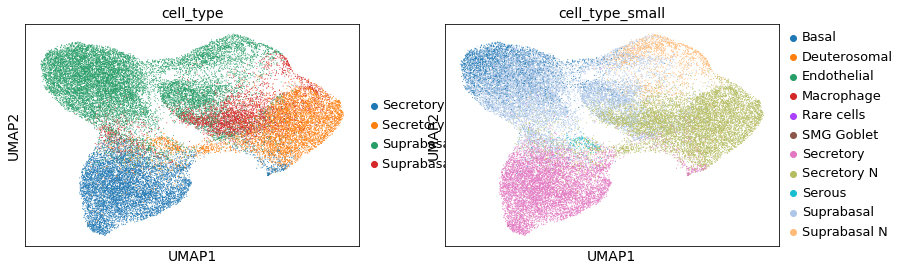

In [16]:
sc.pl.umap(adata, color=['cell_type', 'cell_type_small'], edges = False)

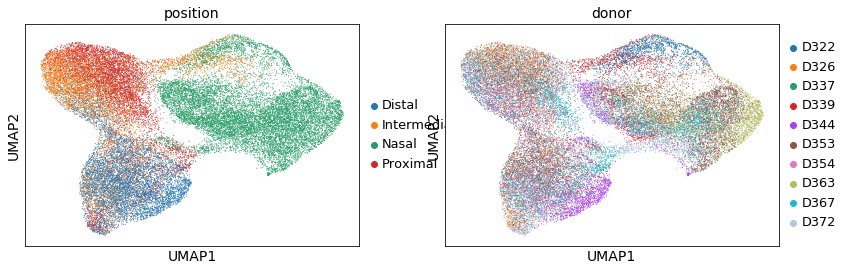

In [17]:
sc.pl.umap(adata, color=['position', 'donor'], edges = False)

In [18]:
communities, graph, Q = sc.external.tl.phenograph(adata.obsm['X_pca'][:,0:5], k=100)

PhenoGraph clustering
Finding 100 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 2.0241267681121826 seconds
Jaccard graph constructed in 20.735263109207153 seconds
Wrote graph to binary file in 13.491764307022095 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.82056
After 13 runs, maximum modularity is Q = 0.822371
Louvain completed 33 runs in 110.86160373687744 seconds
PhenoGraph complete in 147.56638646125793 seconds
    finished (0:02:28.68)


In [22]:
#adata.obs['phenograph_SCs'] = pd.Categorical(communities)
adata.obs.insert(18, 'phenograph_SCs', pd.Categorical(communities))

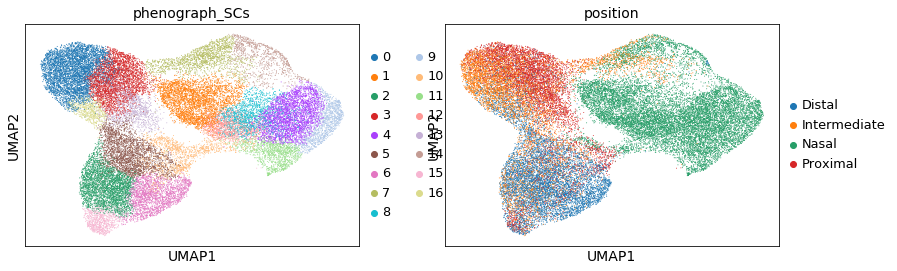

In [23]:
sc.pl.umap(adata, color=['phenograph_SCs', 'position'])

***
***
## Focus on Suprabasal and Basal cells

In [21]:
cell_bool = []

for x in adata.obs['cell_type_small']:
    cell_bool = cell_bool + [x in ['Suprabasal', 'Suprabasal N', 'Basal']]


In [22]:
list_of_cell_names = adata.obs.loc[cell_bool, :].index.tolist()
adata = adata[list_of_cell_names, ]
adata.shape

(37972, 18417)

In [23]:
adata = sc.AnnData(adata)

In [24]:
sc.tl.pca(adata, svd_solver='arpack')

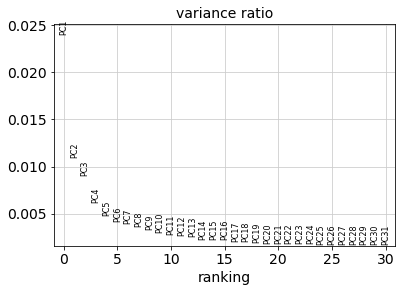

In [25]:
sc.pl.pca_variance_ratio(adata, log = False)

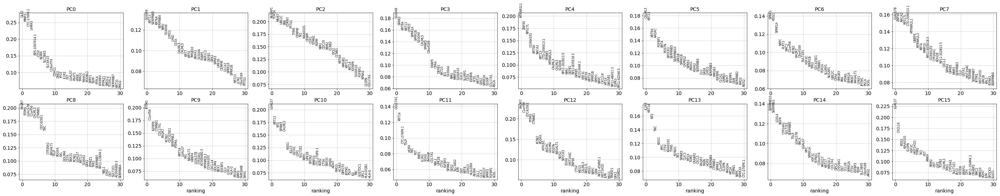

In [26]:
sc.pl.pca_loadings(adata, components=list(range(0,16)))

In [27]:
sc.pp.neighbors(adata, n_neighbors=100, n_pcs=5)

computing neighbors
    using 'X_pca' with n_pcs = 5
    finished (0:00:45.62) --> added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix


In [28]:
sc.tl.umap(adata)

computing UMAP
    finished (0:01:11.70) --> added
    'X_umap', UMAP coordinates (adata.obsm)


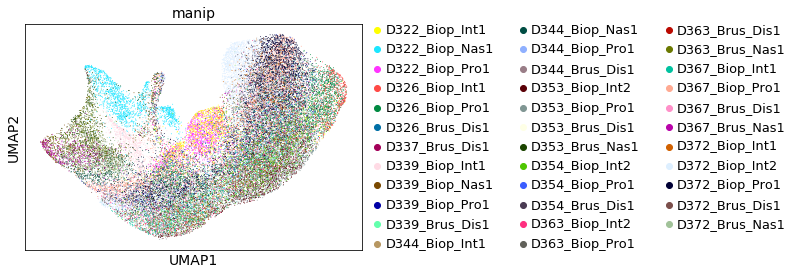

In [29]:
sc.pl.umap(adata, color=['manip'], edges = False)

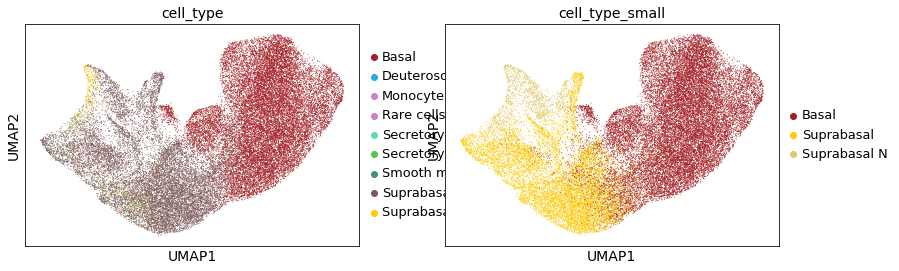

In [30]:
sc.pl.umap(adata, color=['cell_type', 'cell_type_small'], edges = False)

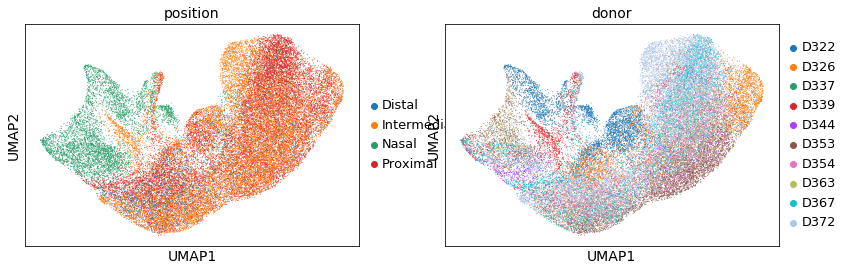

In [31]:
sc.pl.umap(adata, color=['position', 'donor'], edges = False)